In [2]:
import gensim.downloader as api
dataset = api.load('text8')

In [9]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import random
from sklearn.model_selection import train_test_split

from tensorflow.keras.layers import Input, Embedding, GlobalAveragePooling1D, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.text import Tokenizer

(9997.182245737802, 116.17898450079628)

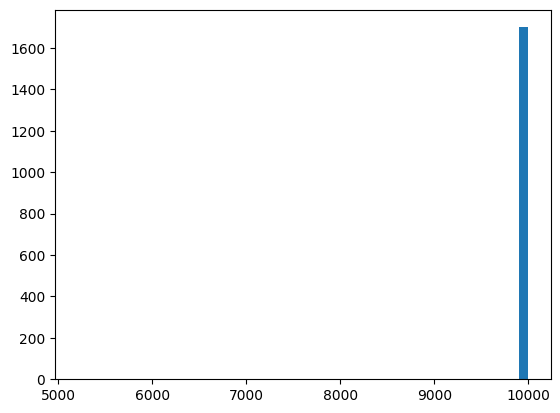

In [4]:
doc_lengths = []
for x in dataset:
    l = len(x)
    doc_lengths.append(l)

plt.hist(doc_lengths, bins=50);
np.mean(doc_lengths), np.std(doc_lengths)

In [6]:
# Data preprocess
vocab_size = 20_000
tokenizer = Tokenizer(oov_token="<OOV>", num_words=vocab_size)
tokenizer.fit_on_texts(dataset)
sequences = tokenizer.texts_to_sequences(dataset)

In [7]:
sequences

[[5235,
  3082,
  13,
  7,
  196,
  3,
  3135,
  47,
  60,
  157,
  129,
  743,
  478,
  10573,
  135,
  2,
  1,
  3,
  2,
  104,
  856,
  4,
  2,
  15069,
  1,
  3,
  2,
  152,
  856,
  3582,
  2,
  196,
  12,
  192,
  60,
  6,
  7,
  10714,
  216,
  8,
  1326,
  106,
  456,
  21,
  60,
  2733,
  364,
  8,
  3674,
  2,
  710,
  3,
  373,
  28,
  42,
  38,
  55,
  541,
  99,
  13,
  7,
  1425,
  2759,
  20,
  569,
  688,
  7090,
  2,
  249,
  5235,
  12,
  1054,
  29,
  2,
  322,
  250,
  1,
  2879,
  794,
  188,
  5235,
  13,
  7,
  202,
  604,
  12,
  2,
  1136,
  21,
  2623,
  27,
  8985,
  4,
  281,
  33,
  4149,
  143,
  61,
  27,
  6439,
  4188,
  3,
  155,
  34,
  364,
  5235,
  38,
  1139,
  8,
  449,
  346,
  1820,
  21,
  4862,
  2,
  6755,
  3,
  7575,
  1776,
  568,
  2,
  95,
  2,
  249,
  11066,
  13,
  53,
  7090,
  91,
  28,
  272,
  39,
  5950,
  4863,
  1,
  30,
  1,
  43,
  319,
  7,
  1,
  529,
  7575,
  373,
  6,
  260,
  3,
  155,
  27,
  1208,
  13,
  7575,
  202

In [10]:
# Building the model
random.seed(1)
np.random.seed(1)
tf.random.set_seed(1)

dim = 50
# Specifying input
inputs = Input(shape=(10,), name="Context_Words_Input")
# First layer -> Embedding
embedding = Embedding(
    input_dim=vocab_size, 
    output_dim=dim, 
    name="Word_Embedding_Matrix"
)(inputs)
# Second layer -> Getting the average
averaged_context = GlobalAveragePooling1D(name="Average_Pooling")(embedding)
# Third layer -> Finding the middle word(output)
outputs = Dense(units=vocab_size, activation=None, use_bias=False, name="Target_Word_Predictions")(averaged_context)

cbow_model = Model(inputs=inputs, outputs=outputs, name="CBOW_Word2Vec")
cbow_model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy']
)
cbow_model.summary()

Model: "CBOW_Word2Vec"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Context_Words_Input (InputL  [(None, 10)]             0         
 ayer)                                                           
                                                                 
 Word_Embedding_Matrix (Embe  (None, 10, 50)           1000000   
 dding)                                                          
                                                                 
 Average_Pooling (GlobalAver  (None, 50)               0         
 agePooling1D)                                                   
                                                                 
 Target_Word_Predictions (De  (None, 20000)            1000000   
 nse)                                                            
                                                                 
Total params: 2,000,000
Trainable params: 2,000,000
N

In [11]:
# Train and Test data
context_size = 10
half_context_size = context_size // 2
def data_generator(sequences, batch_size=128):
    n_batches = int(np.ceil(len(sequences) / batch_size))
    
    while True:
        random.shuffle(sequences)
        
        for i in range(n_batches):
            batch_sequences = sequences[i * batch_size : (i + 1) * batch_size]
            current_batch_size = len(batch_sequences)
            
            X_batch = np.zeros((current_batch_size, context_size))
            Y_batch = np.zeros(current_batch_size)
            
            for ii in range(current_batch_size):
                seq = batch_sequences[ii]
                if len(seq) <= context_size + 1:
                    continue
                j = np.random.randint(0, len(seq) - context_size - 1)
                
                x1 = seq[j : j + half_context_size]
                x2 = seq[j + half_context_size + 1 : j + context_size + 1]
                
                X_batch[ii, :half_context_size] = x1
                X_batch[ii, half_context_size:] = x2
                
                Y_batch[ii] = seq[j + half_context_size]
                
            yield X_batch, Y_batch

train_sequences, test_sequences = train_test_split(sequences, test_size=0.2, random_state=42)

BATCH_SIZE = 512 
train_gen = data_generator(train_sequences, batch_size=BATCH_SIZE)
test_gen = data_generator(test_sequences, batch_size=BATCH_SIZE)

In [14]:
# Training the model
BATCH_SIZE = 128

history = cbow_model.fit(
    train_gen,
    epochs=100,
    steps_per_epoch=int(np.ceil(len(train_sequences) / BATCH_SIZE)),
    validation_data=val_gen,
    validation_steps=int(np.ceil(len(test_sequences) / BATCH_SIZE))
    )

Epoch 1/100
11/11 [==============================] - 2s 155ms/step - loss: 6.7905 - accuracy: 0.0753 - val_loss: 6.7853 - val_accuracy: 0.0850
Epoch 2/100
11/11 [==============================] - 2s 167ms/step - loss: 6.7784 - accuracy: 0.0727 - val_loss: 6.8017 - val_accuracy: 0.0626
Epoch 3/100
11/11 [==============================] - 2s 176ms/step - loss: 6.8381 - accuracy: 0.0698 - val_loss: 6.7323 - val_accuracy: 0.0792
Epoch 4/100
11/11 [==============================] - 2s 161ms/step - loss: 6.7352 - accuracy: 0.0763 - val_loss: 6.8187 - val_accuracy: 0.0635
Epoch 5/100
11/11 [==============================] - 2s 169ms/step - loss: 6.7826 - accuracy: 0.0707 - val_loss: 6.6564 - val_accuracy: 0.0655
Epoch 6/100
11/11 [==============================] - 2s 172ms/step - loss: 6.7914 - accuracy: 0.0733 - val_loss: 6.6984 - val_accuracy: 0.0802
Epoch 7/100
11/11 [==============================] - 2s 159ms/step - loss: 6.7872 - accuracy: 0.0690 - val_loss: 6.8694 - val_accuracy: 0.0792

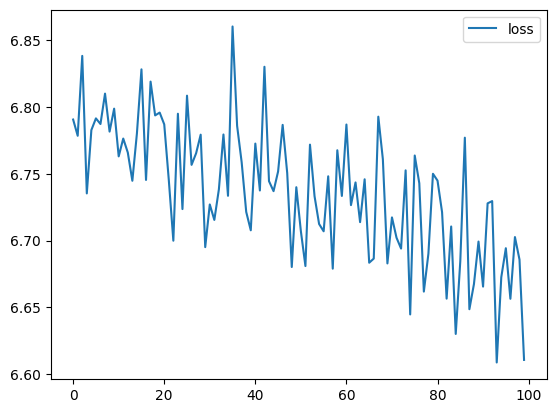

In [16]:
plt.plot(history.history['loss'], label='loss')
plt.legend();

In [19]:
from sklearn.neighbors import NearestNeighbors

embeddings = cbow_model.layers[1].get_weights()[0]
neighbors = NearestNeighbors(n_neighbors=5, algorithm='ball_tree')
neighbors.fit(embeddings)

def print_neighbors(query):
    query_idx = tokenizer.word_index[query]
    query_vector = embeddings[query_idx:query_idx + 1]    
    distances, indices = neighbors.kneighbors(query_vector)  
    for idx in indices[0]:
        word = tokenizer.index_word[idx]
        print(word)

In [20]:
print_neighbors("king")

king
section
prince
crown
introduction
